# Active Learning Demonstrations - Synthetic Data

The methods of 
* EEM of Zhu, Gharamani and Lafferty
* V-Optimality of Ji and Han
* Sigma-Optimality of Ma, Garnett, and Schneider
adapted to Graph Based Semi-supervised Regression model, instead of Harmonic Functions. (i.e. noisy observations instead of noiseless)

Given observations $\mathbf{y}$ on a subset $\ell \subset Z$ of labeled nodes, the posterior distribution of $\mathbf{u} |\mathbf{y}$ is given by
$$
    \begin{equation*}
        \mathbf{u} | \mathbf{y} \sim \mathcal{N}(\mathbf{m}, C^*)
    \end{equation*}
$$

where $\mathbf{m} = \frac{1}{\gamma^2} C^* H^T\mathbf{y}, C^* = \left( L + \frac{1}{\gamma^2} I \right)^{-1}$.

In [9]:
import sys
sys.path.append('../')
from util.util import *
from datasets.dataloaders import *
from util.al_util import *
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
%autoreload

# 2 Moons

Loading the 2 moons data with 2002 total points...
Creating Laplacian
Finished making Laplacian, now calculating the eval/evecs
Converting to dense since computing more than half of eigenvectors...


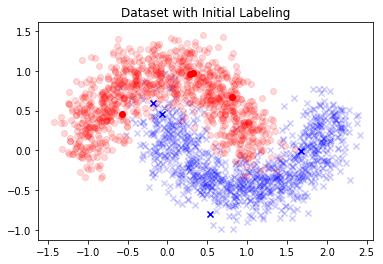

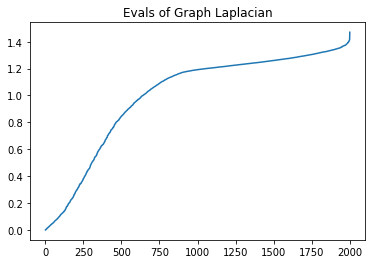

In [3]:
# Setup
N = 2000
moon_data = load_2_moons(N+2, sup_percent=0.004, normed_lap=True,knn=10,sigma=1.)
moon_data.plot_initial()

plt.plot(range(N+2), moon_data.evals)
plt.title("Evals of Graph Laplacian")
plt.show()

Loading the 2 moons data with 2002 total points...
Creating Laplacian
Finished making Laplacian, now calculating the eval/evecs
Converting to dense since computing more than half of eigenvectors...


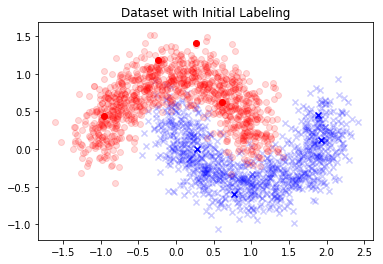

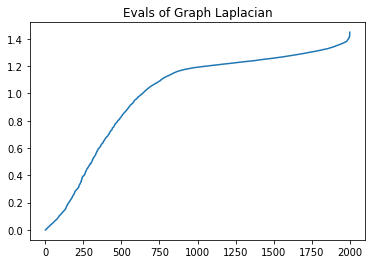

In [18]:
# Setup
N = 2000
moon_data = load_2_moons(N+2, sup_percent=0.004, normed_lap=True,knn=10,sigma=1.)
moon_data.plot_initial()

plt.plot(range(N+2), moon_data.evals)
plt.title("Evals of Graph Laplacian")
plt.show()

In [19]:
# Model Setup
tau, alpha, gamma = .01, 1.0, 0.001
gamma2 = gamma**2.
verbose = True     # set to True if want to see visual of which points chosen
num_iters = 40
batch_size = 5
tag2 = (tau, alpha, gamma2)
test_opts = (batch_size, num_iters, verbose)

calc_orig_multi took 0.459003 seconds
Iter = 0


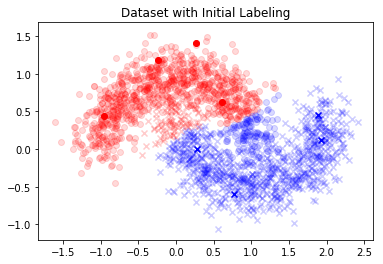

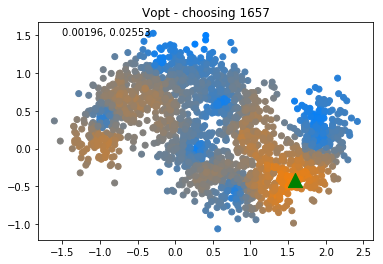

Time for V_opt = 0.530254


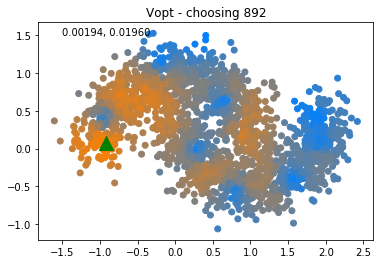

Time for V_opt = 0.394207


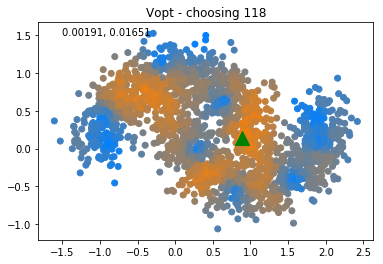

Time for V_opt = 0.399379


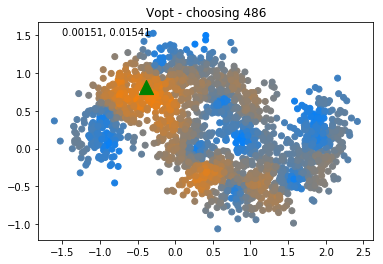

Time for V_opt = 0.388061


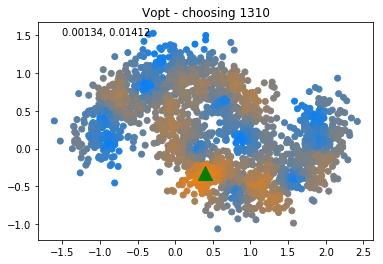

Time for V_opt = 0.387811
Iter = 1


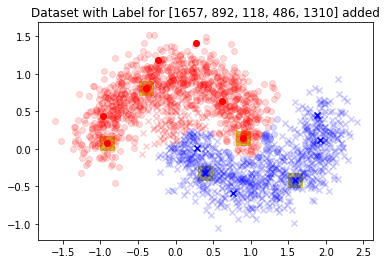

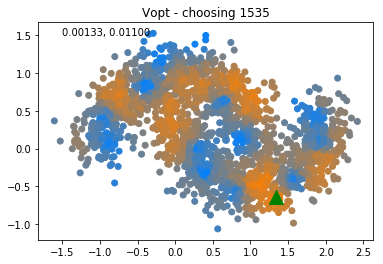

Time for V_opt = 0.369993


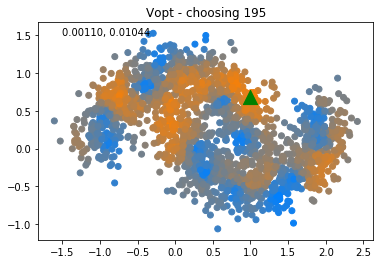

Time for V_opt = 0.388317


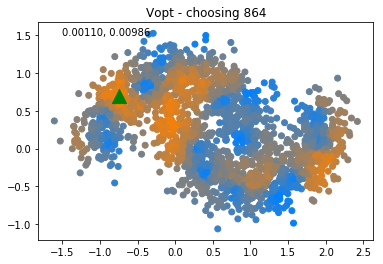

Time for V_opt = 0.398628


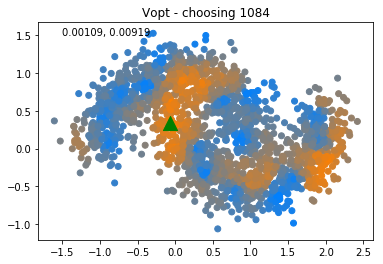

Time for V_opt = 0.395824


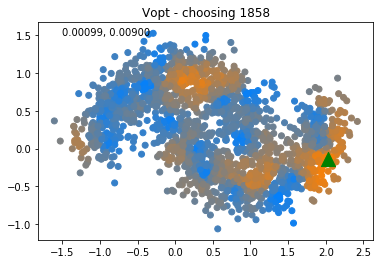

Time for V_opt = 0.394129
Iter = 2


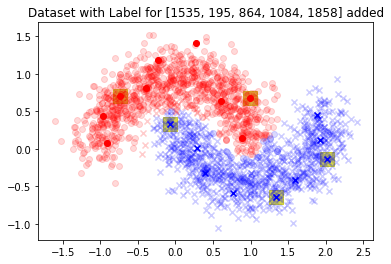

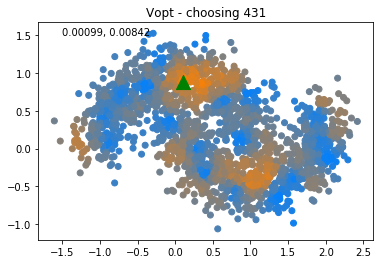

Time for V_opt = 0.387729


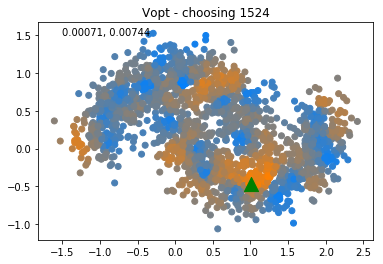

Time for V_opt = 0.370250


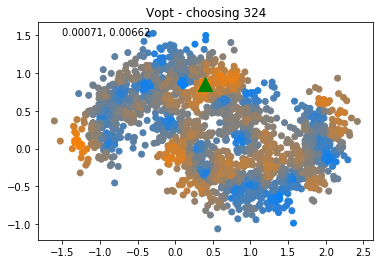

Time for V_opt = 0.385646


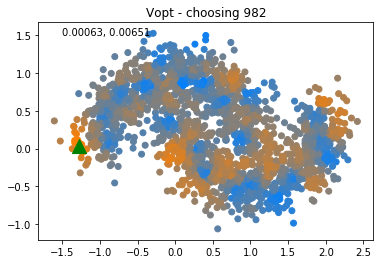

Time for V_opt = 0.388511


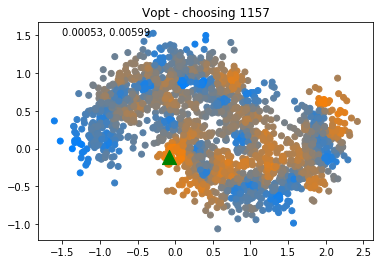

Time for V_opt = 0.386912
Iter = 3


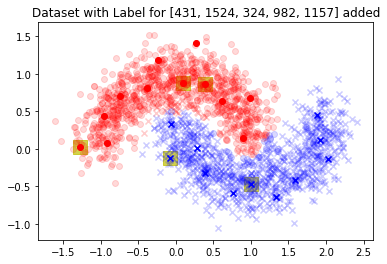

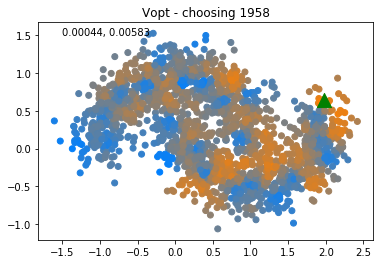

Time for V_opt = 0.357139


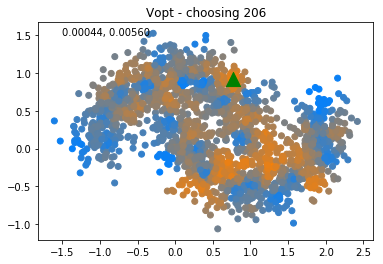

Time for V_opt = 0.388437


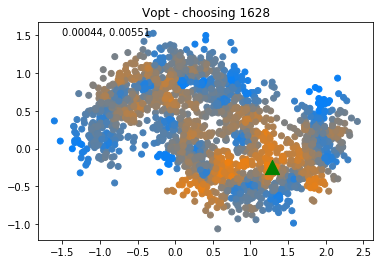

Time for V_opt = 0.386789


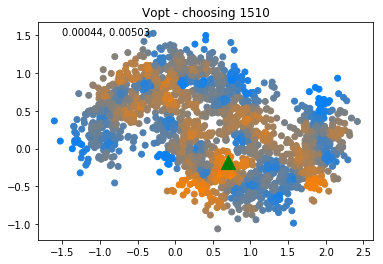

Time for V_opt = 0.386722


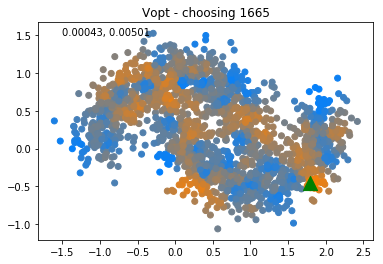

Time for V_opt = 0.409352
Iter = 4


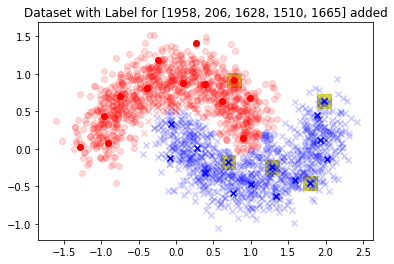

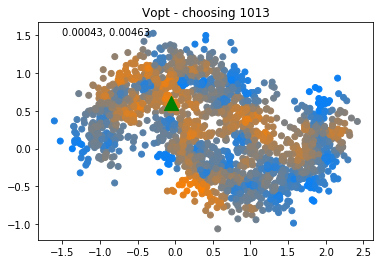

Time for V_opt = 0.375139


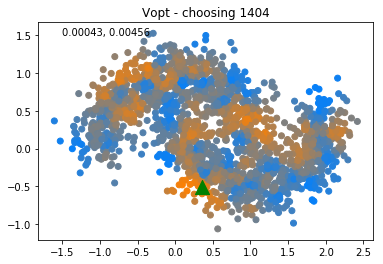

Time for V_opt = 0.389329


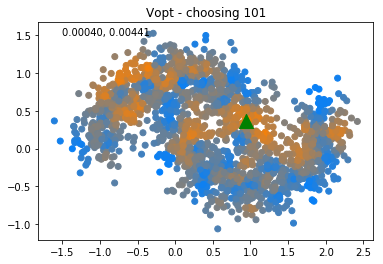

Time for V_opt = 0.392698


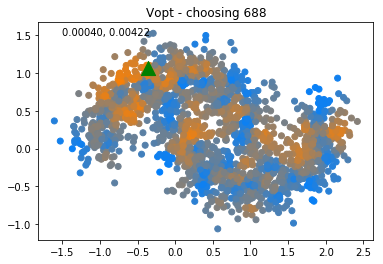

Time for V_opt = 0.384812


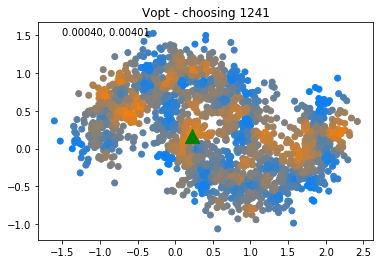

Time for V_opt = 0.391847
Iter = 5


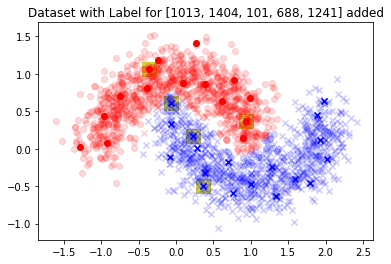

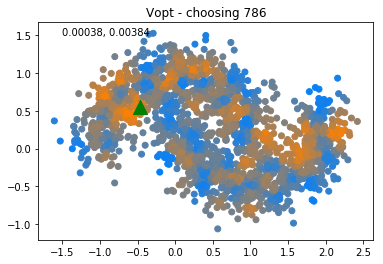

Time for V_opt = 0.381342


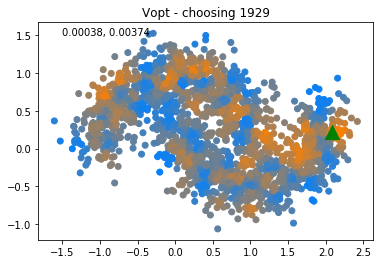

Time for V_opt = 0.391422


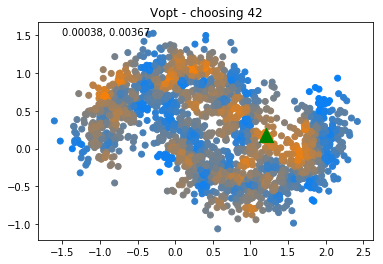

Time for V_opt = 0.391070


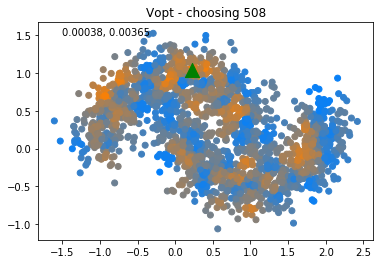

Time for V_opt = 0.398891


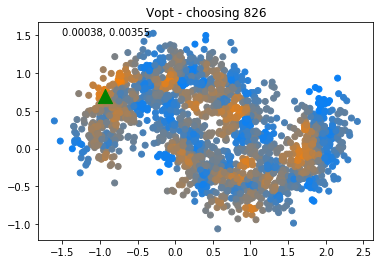

Time for V_opt = 0.392150
Iter = 6


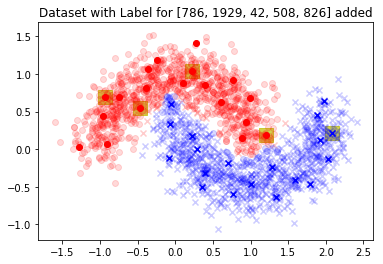

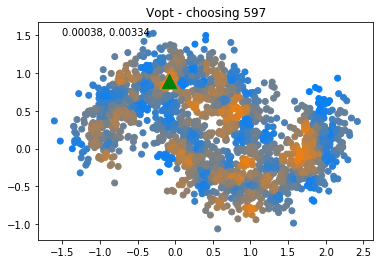

Time for V_opt = 0.377699


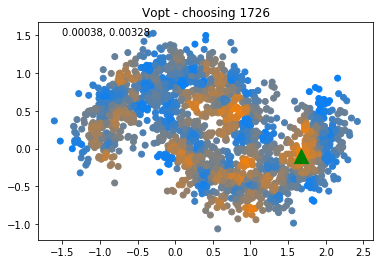

Time for V_opt = 0.400442


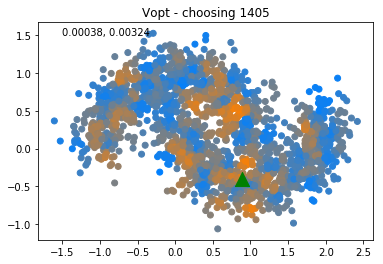

Time for V_opt = 0.394968


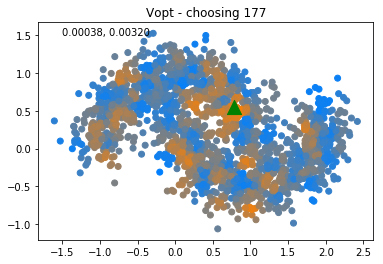

Time for V_opt = 0.389362


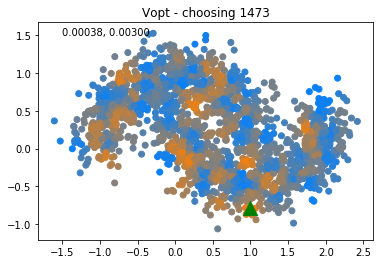

Time for V_opt = 0.567294
Iter = 7


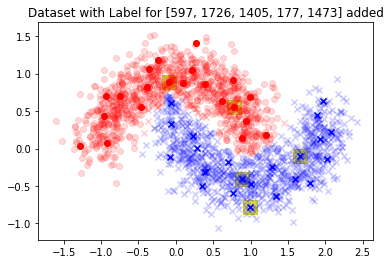

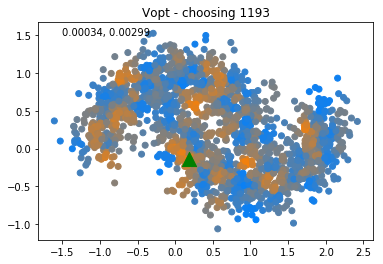

Time for V_opt = 0.398830


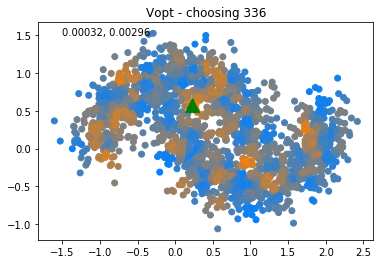

Time for V_opt = 0.378894


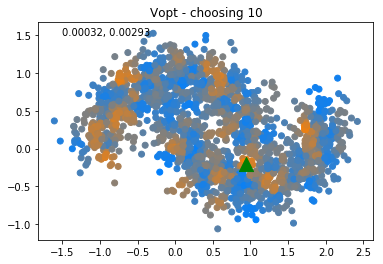

Time for V_opt = 0.364093


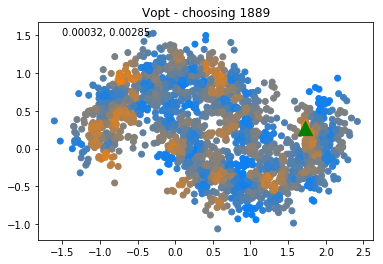

Time for V_opt = 0.392049


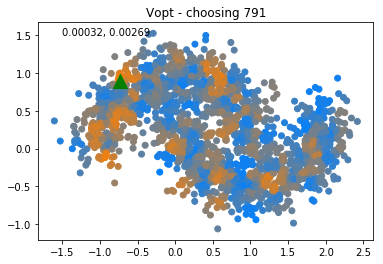

Time for V_opt = 0.400784
Iter = 8


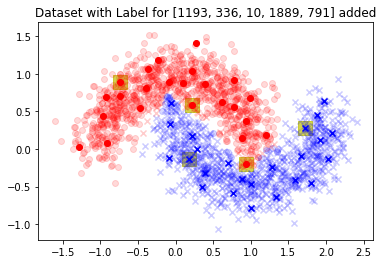

[(-1, 0.12237762237762238), ([1657, 892, 118, 486, 1310], 0.07742257742257742), ([1535, 195, 864, 1084, 1858], 0.03796203796203796), ([431, 1524, 324, 982, 1157], 0.038461538461538464), ([1958, 206, 1628, 1510, 1665], 0.04295704295704296), ([1013, 1404, 101, 688, 1241], 0.03596403596403597), ([786, 1929, 42, 508, 826], 0.032467532467532464), ([597, 1726, 1405, 177, 1473], 0.03146853146853147), ([1193, 336, 10, 1889, 791], 0.03496503496503497)]


In [20]:
# Active Learning Choices  -- V_Opt
fid = copy.deepcopy(moon_data.fid)
method = 'V'
ERRS_V, M_V = run_test_AL_VS_multi(moon_data.X, moon_data.evecs, moon_data.evals, fid, moon_data.ground_truth,
                                   method=method, tag2=tag2, test_opts=test_opts)

if verbose:
    print(ERRS_V)

calc_orig_multi took 0.599029 seconds
Iter = 0


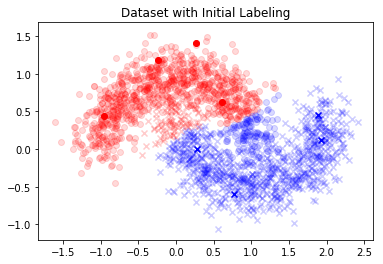

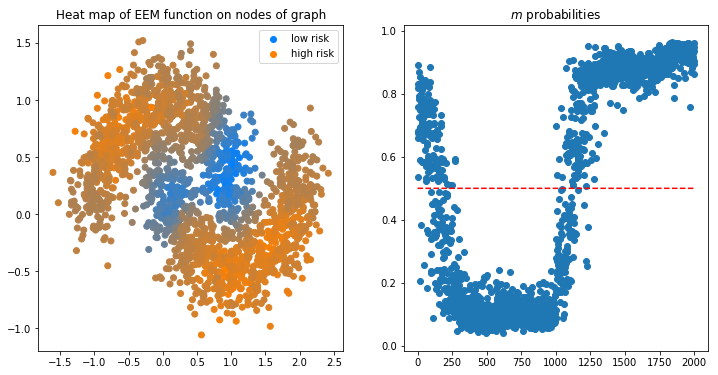

True
Iter = 1


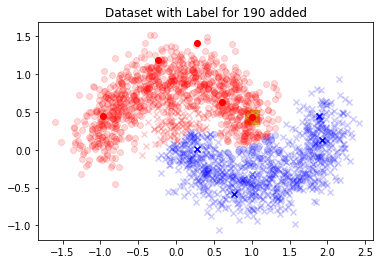

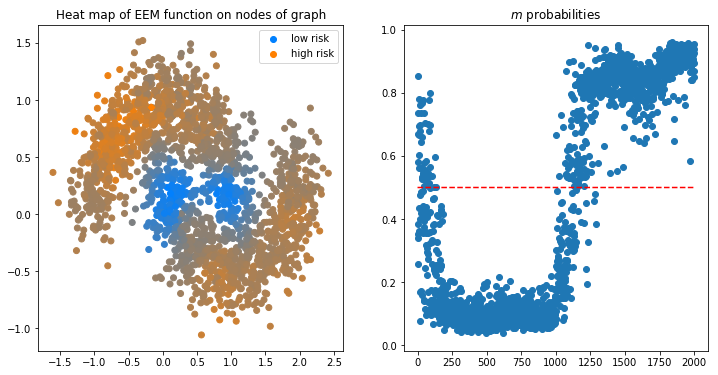

True
Iter = 2


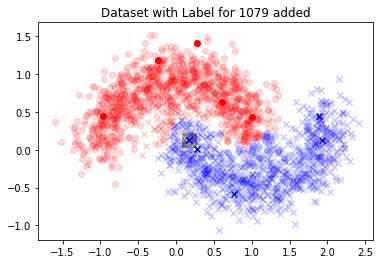

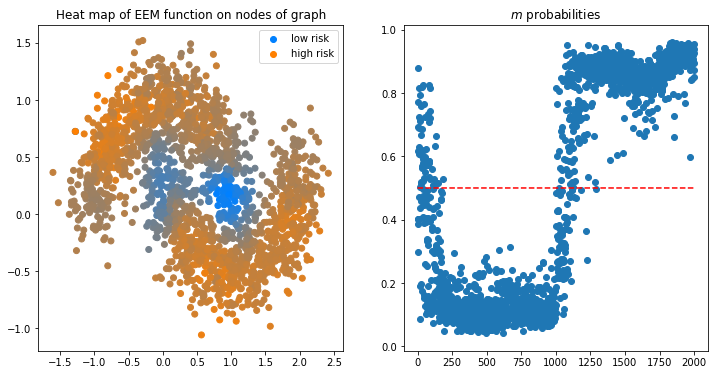

True
Iter = 3


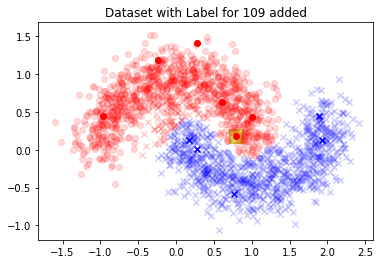

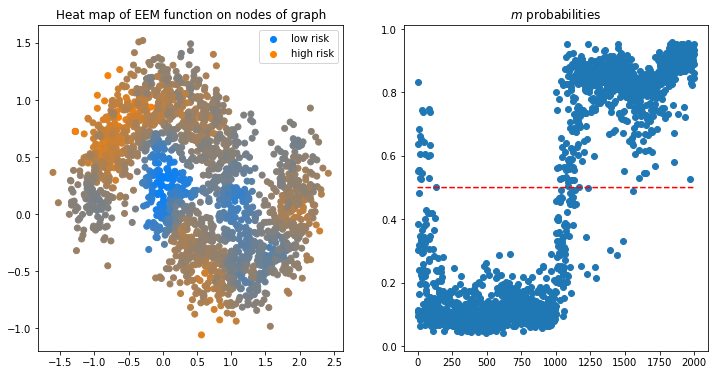

True
Iter = 4


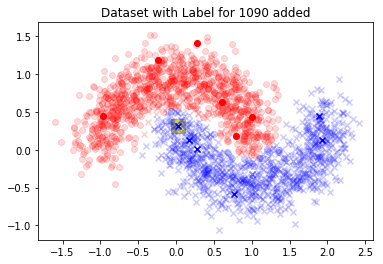

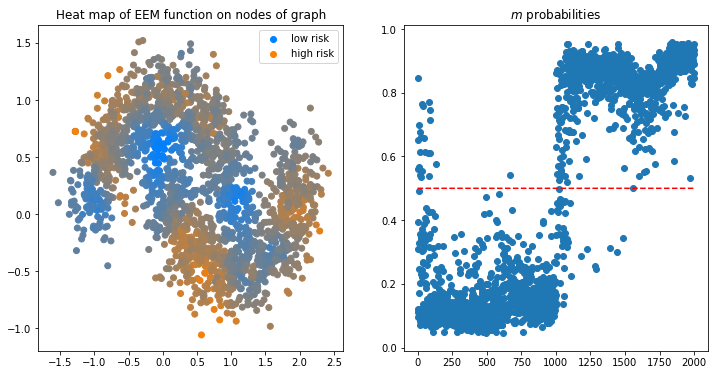

True
Iter = 5


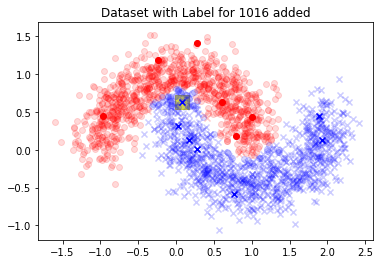

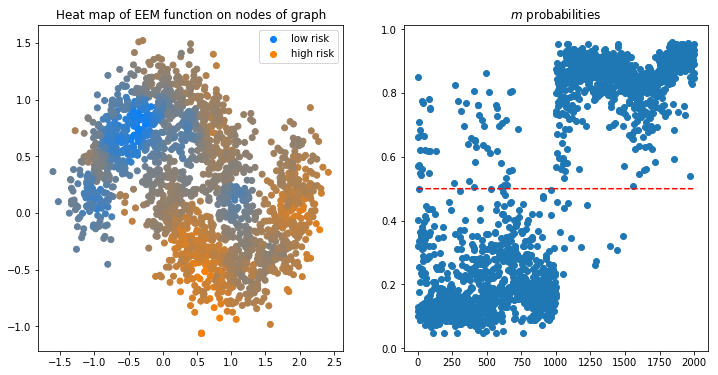

True
Iter = 6


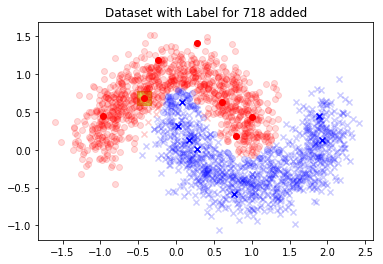

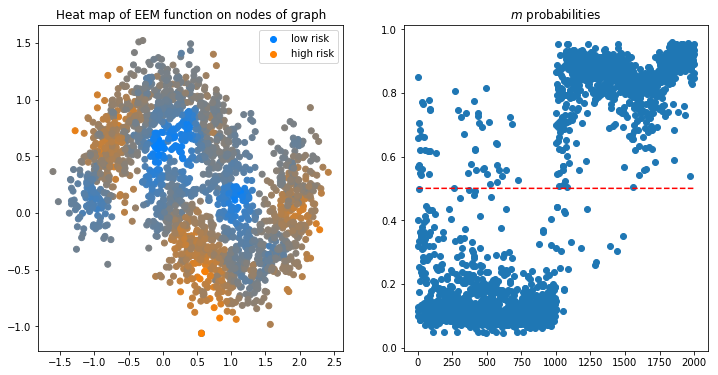

True
Iter = 7


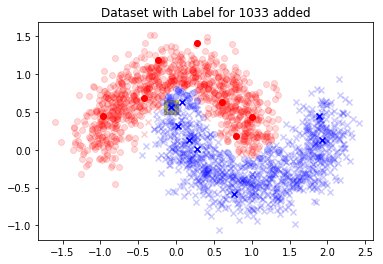

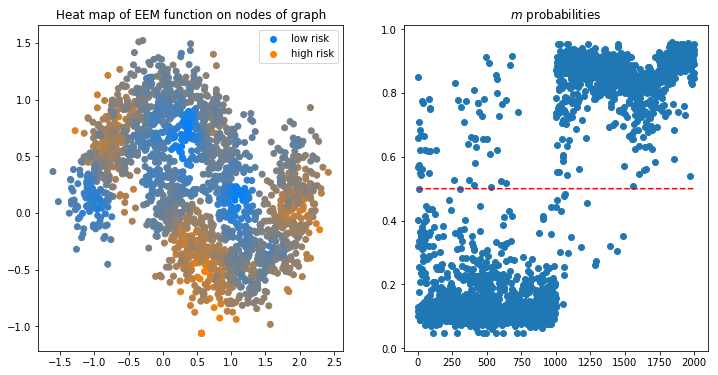

True
Iter = 8


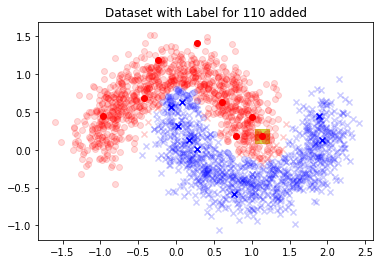

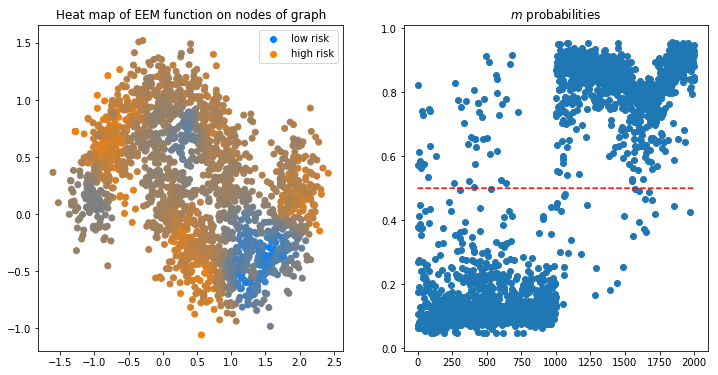

True
Iter = 9


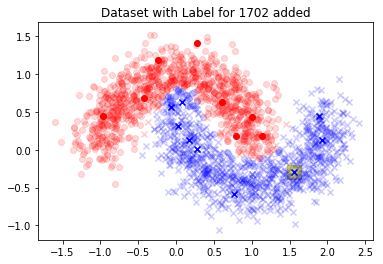

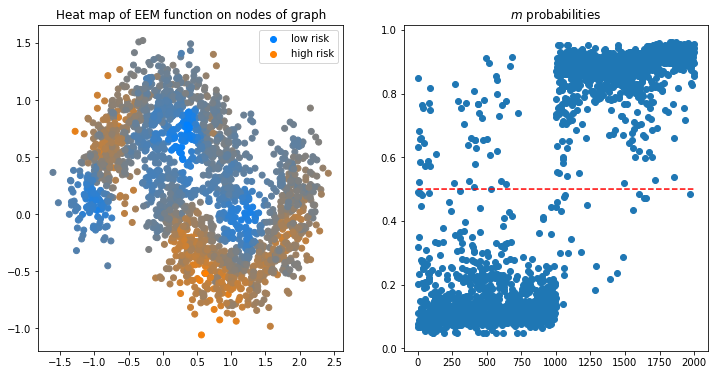

True
Iter = 10


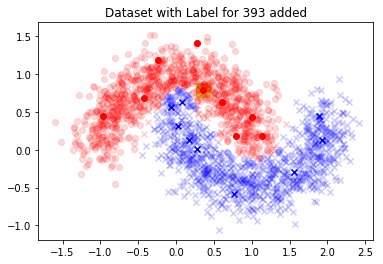

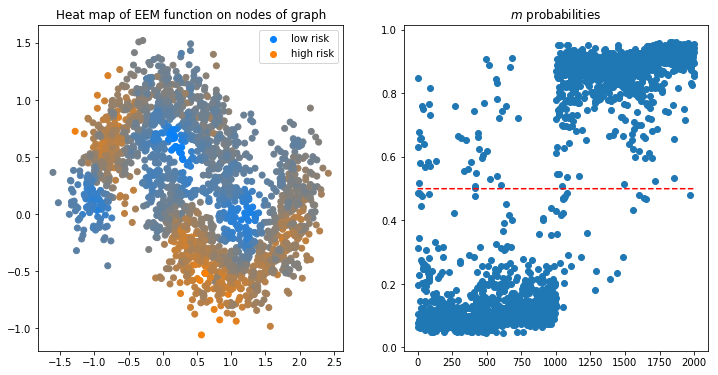

True
Iter = 11


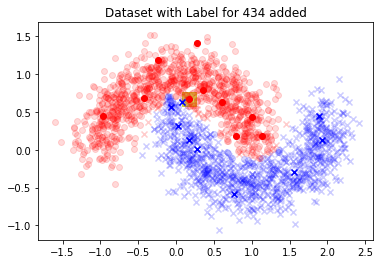

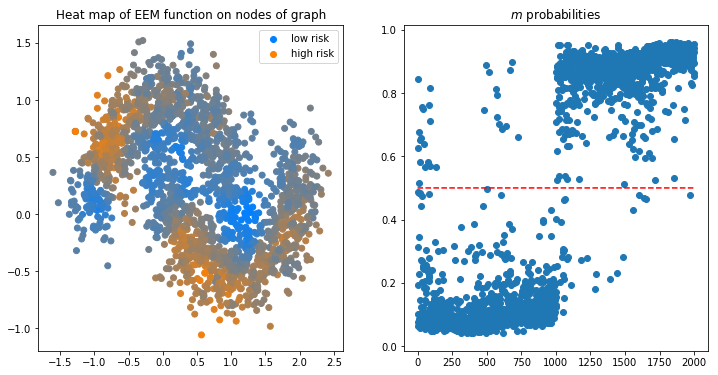

True
Iter = 12


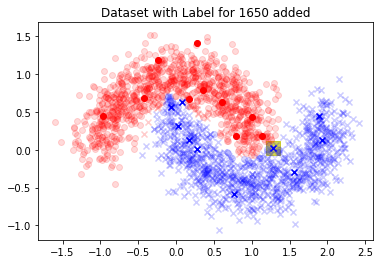

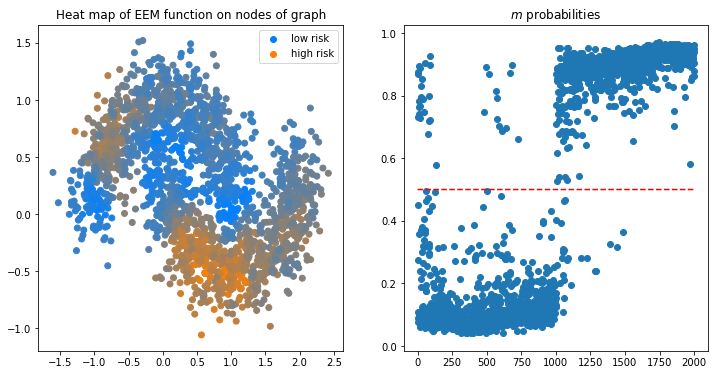

True
Iter = 13


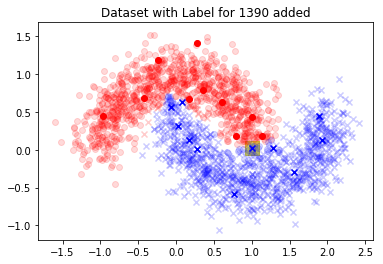

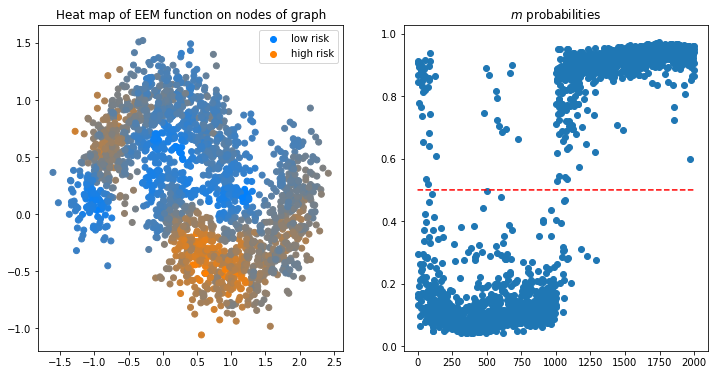

True
Iter = 14


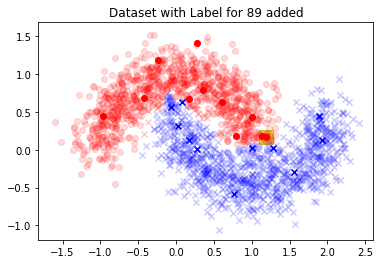

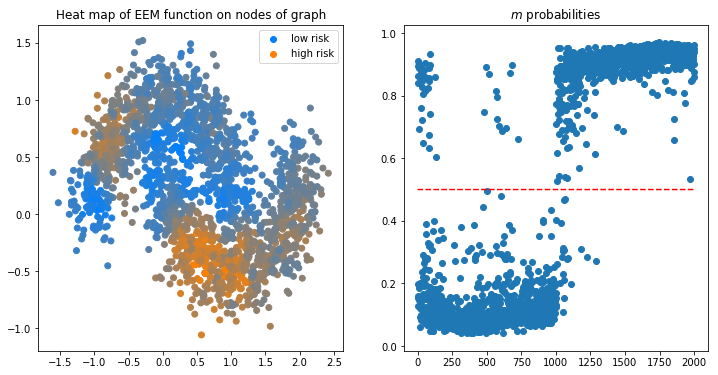

True
Iter = 15


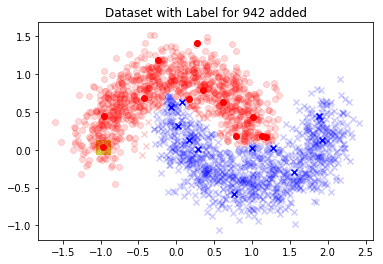

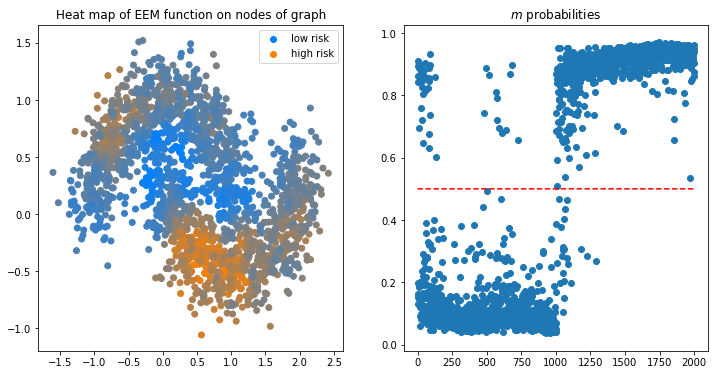

True
Iter = 16


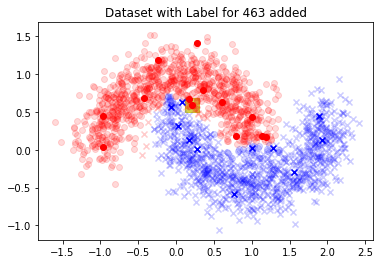

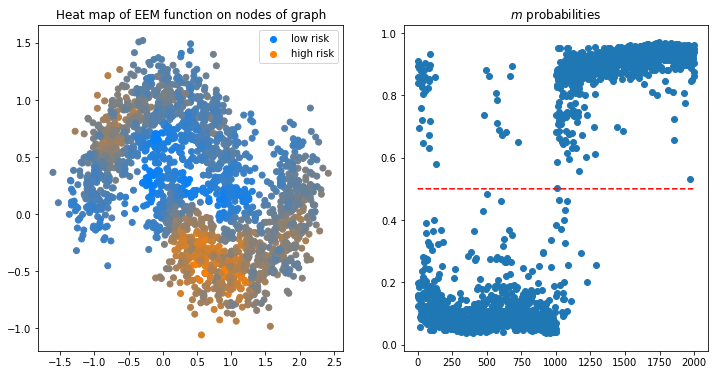

True
Iter = 17


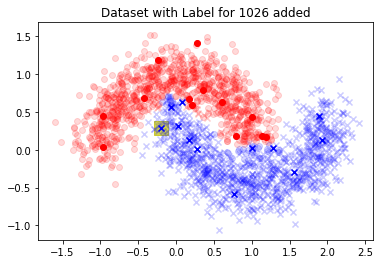

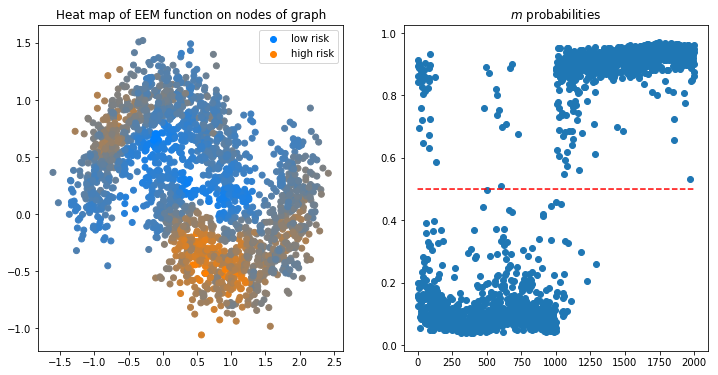

True
Iter = 18


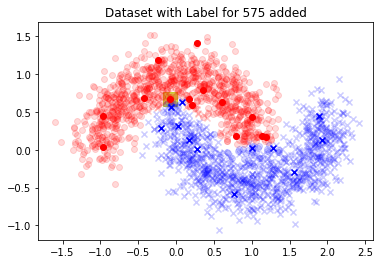

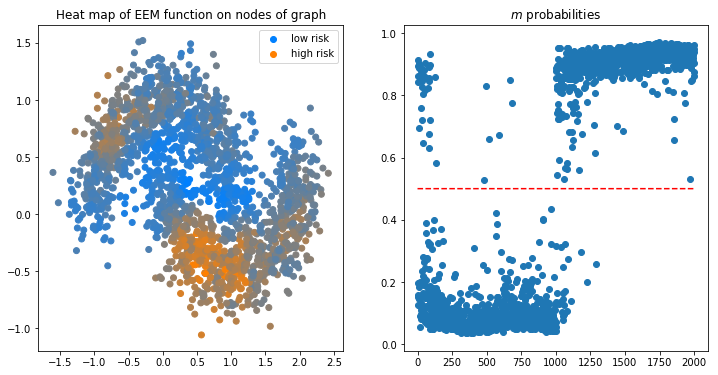

True
Iter = 19


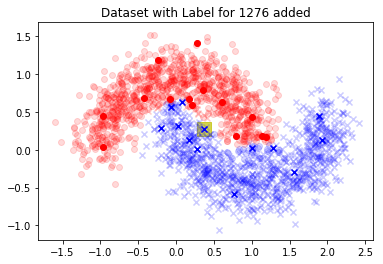

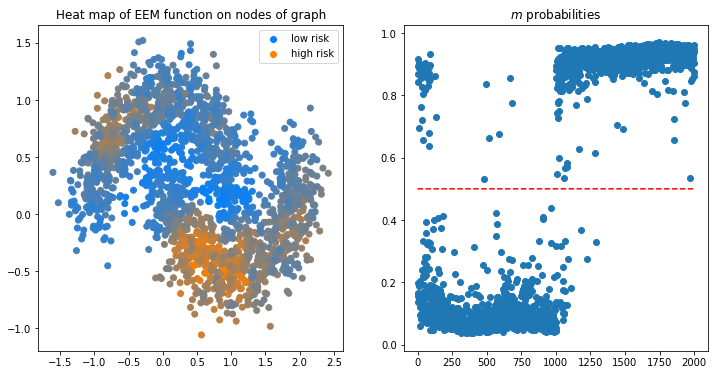

True
Iter = 20


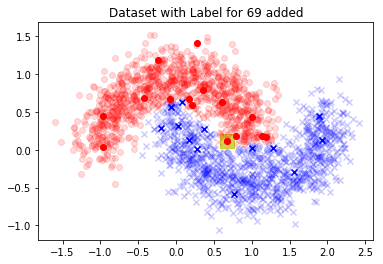

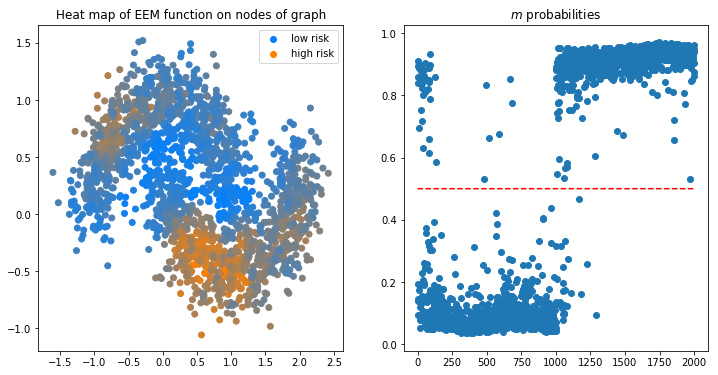

True
Iter = 21


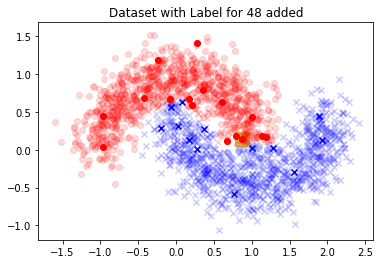

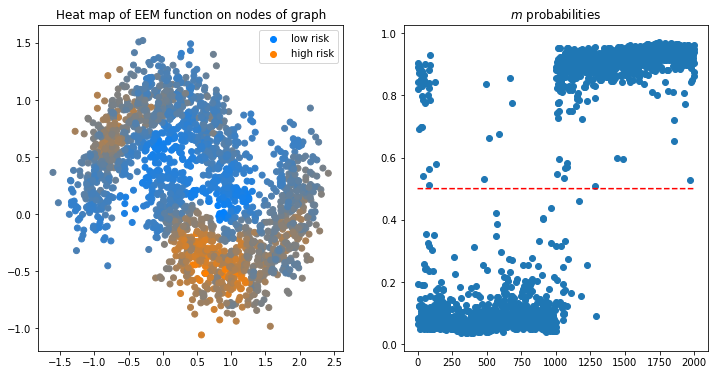

True
Iter = 22


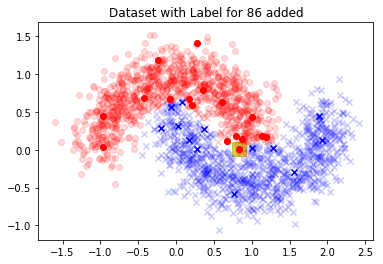

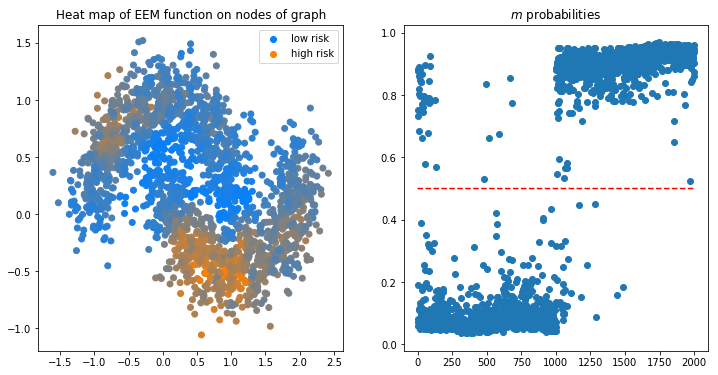

True
Iter = 23


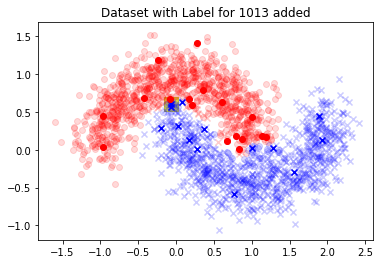

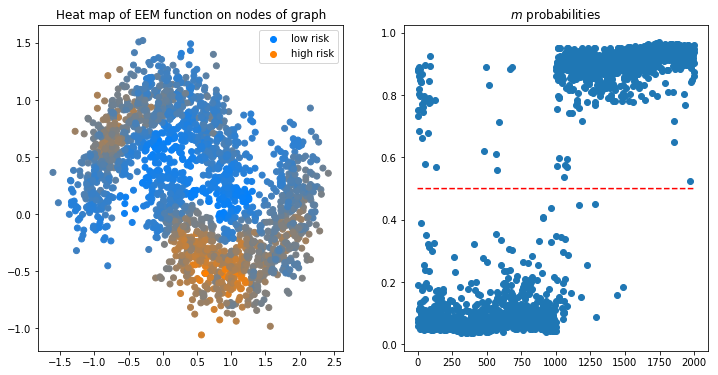

True
Iter = 24


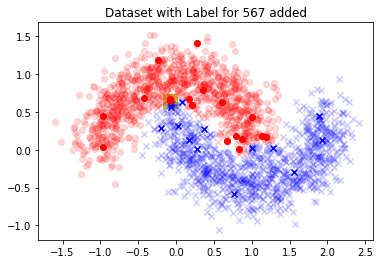

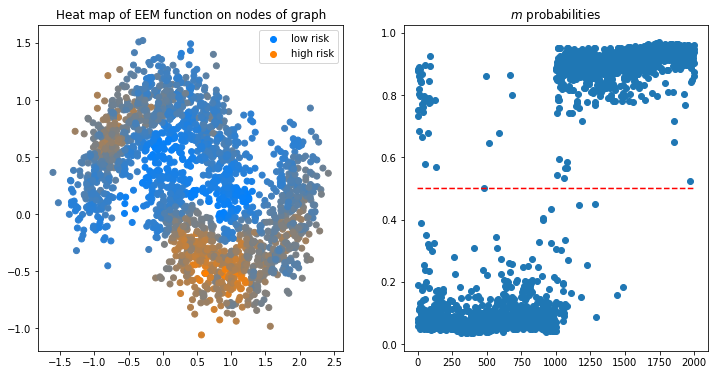

True
Iter = 25


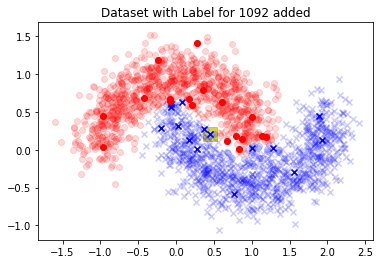

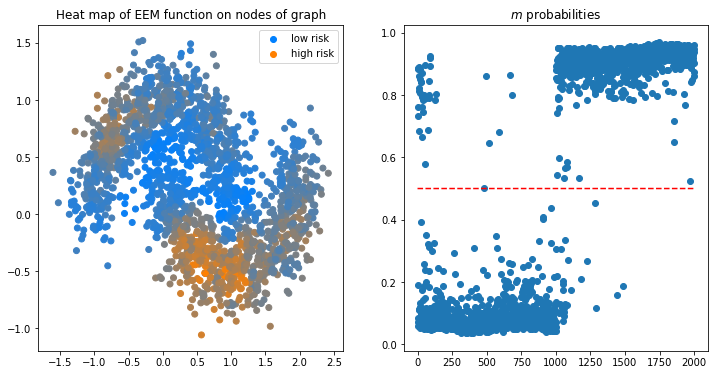

True
Iter = 26


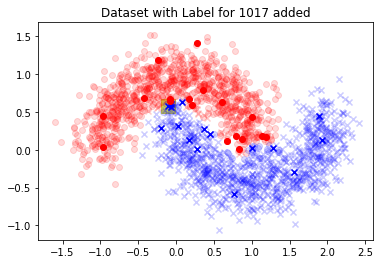

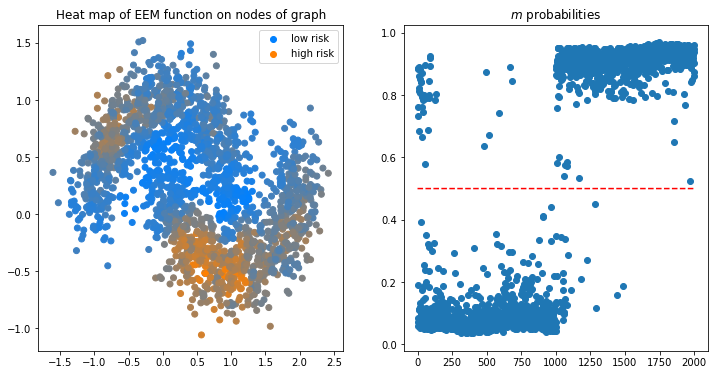

True
Iter = 27


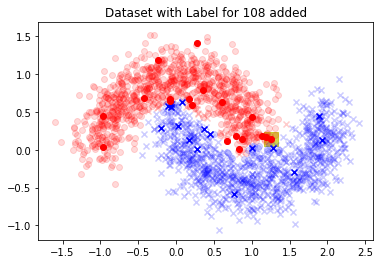

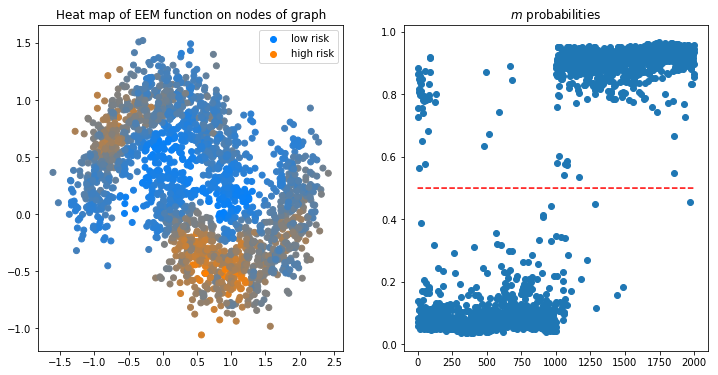

True
Iter = 28


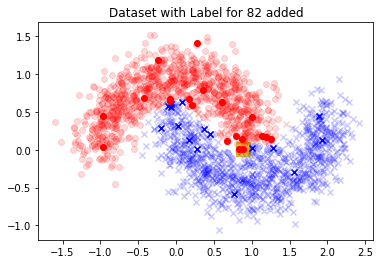

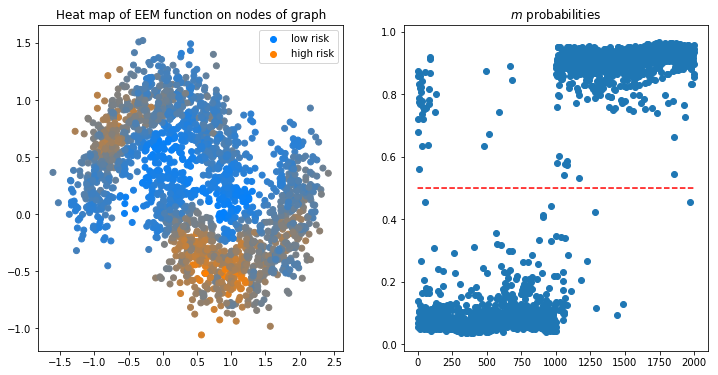

True
Iter = 29


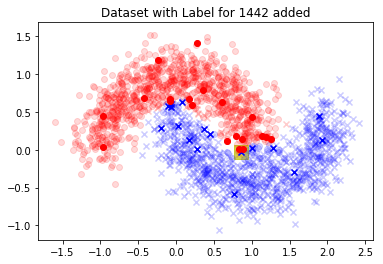

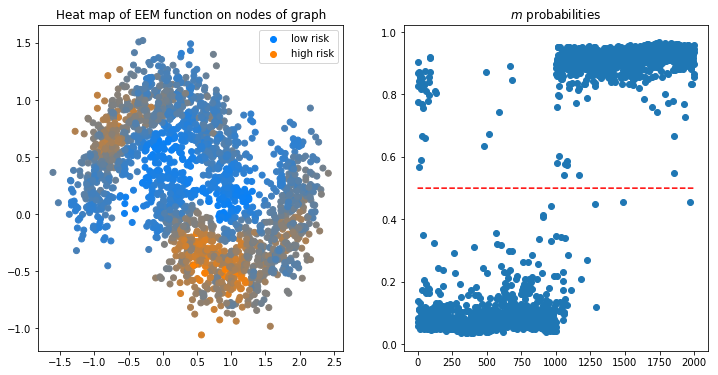

True
Iter = 30


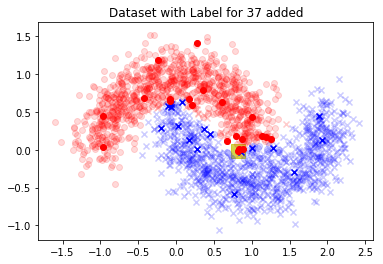

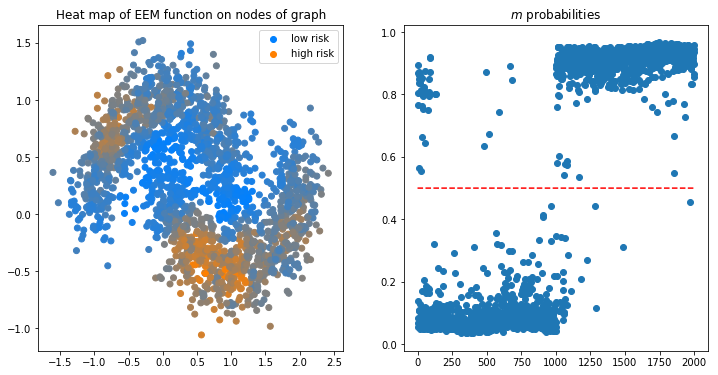

True
Iter = 31


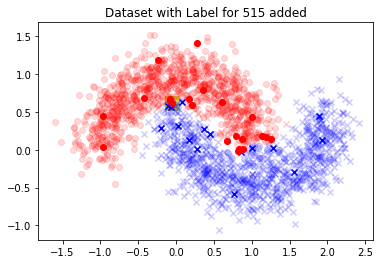

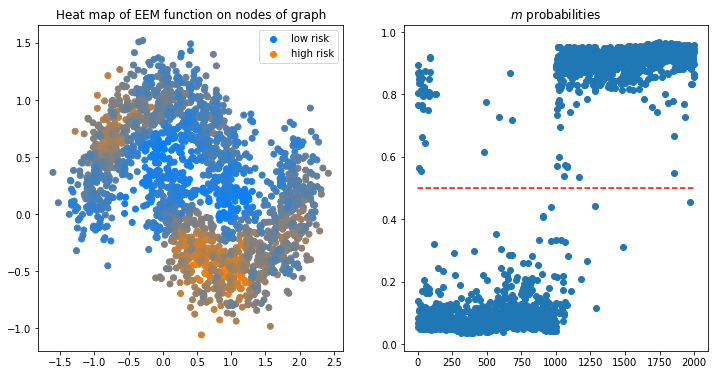

True
Iter = 32


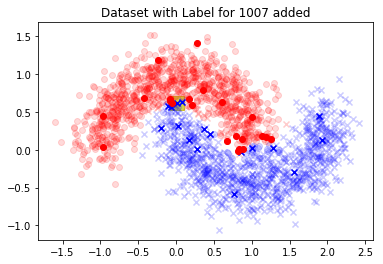

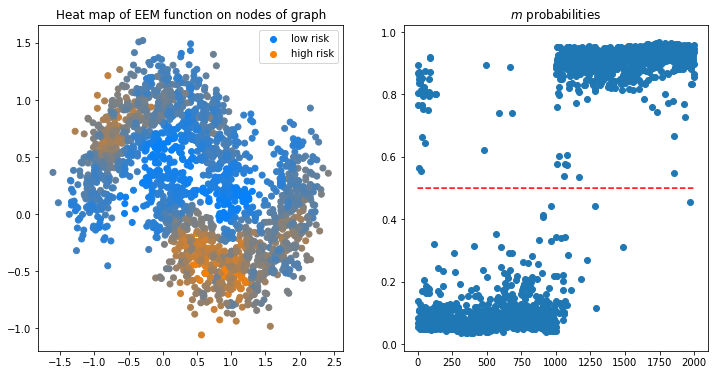

True
Iter = 33


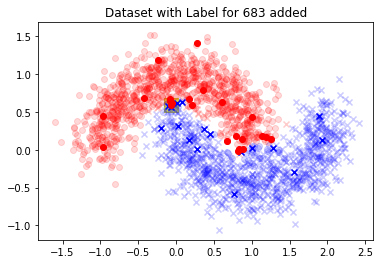

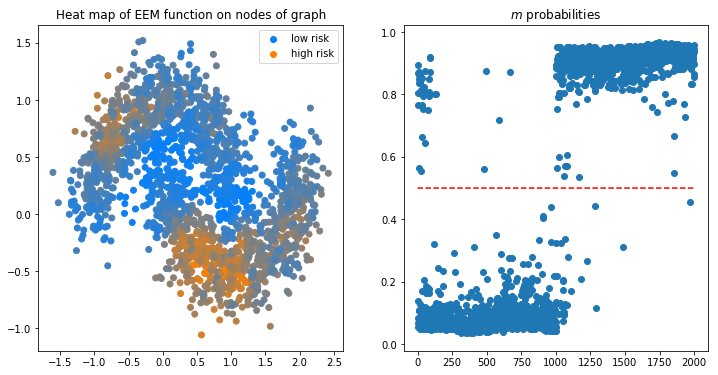

True
Iter = 34


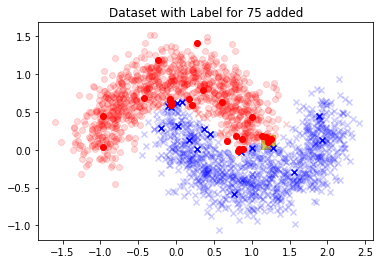

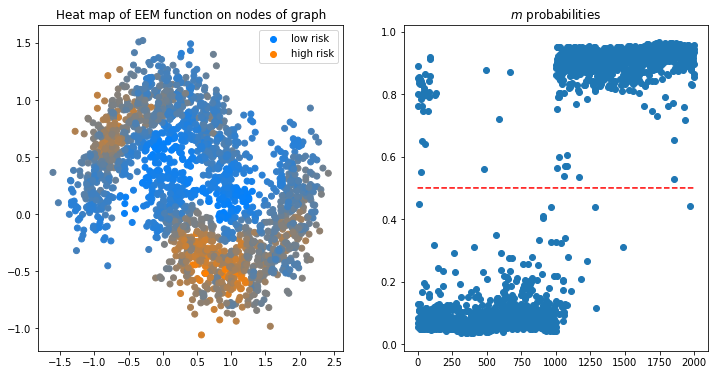

True
Iter = 35


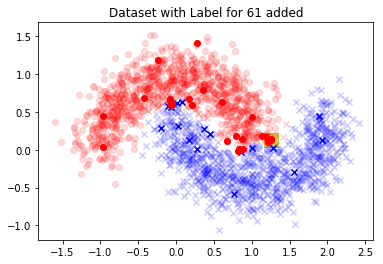

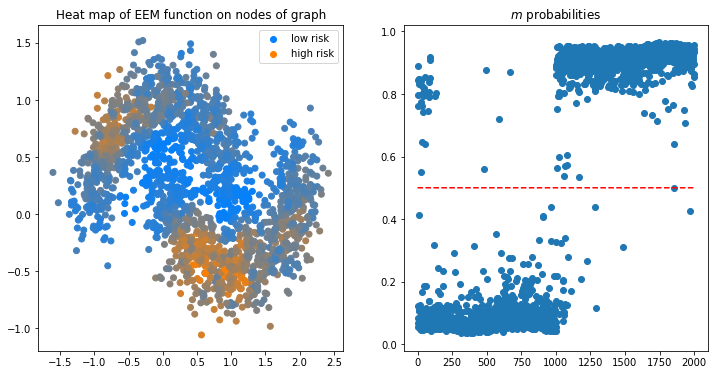

True
Iter = 36


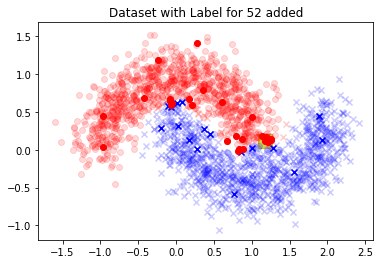

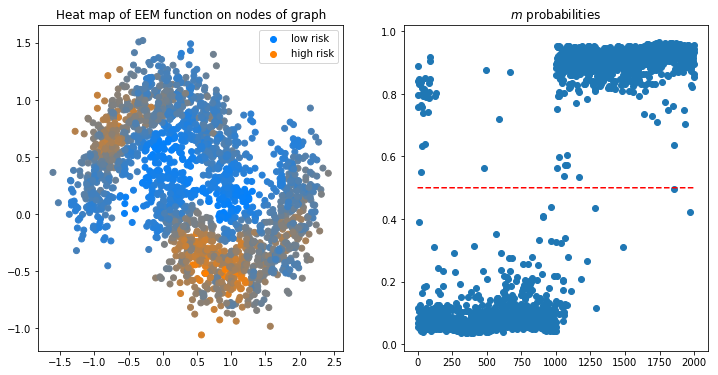

True
Iter = 37


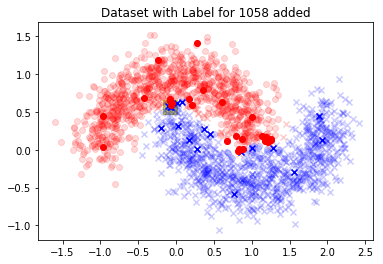

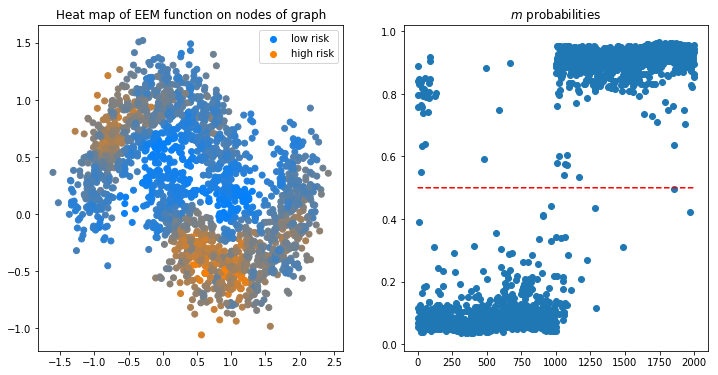

True
Iter = 38


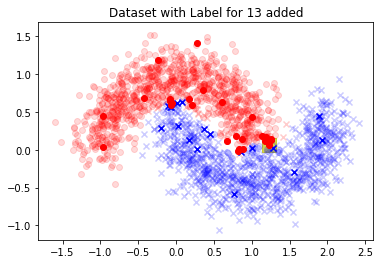

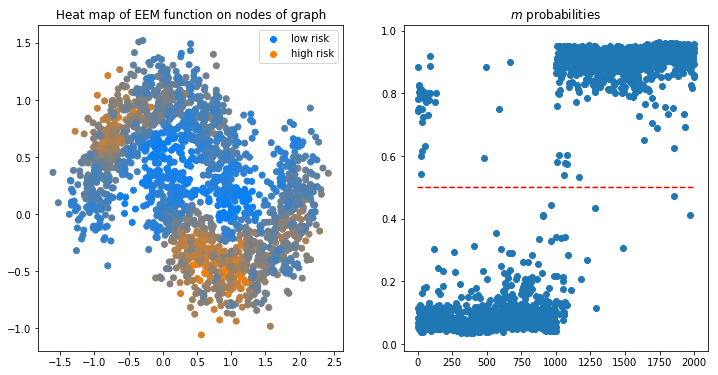

True
Iter = 39


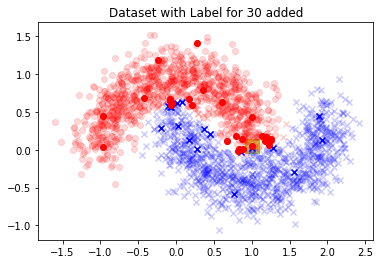

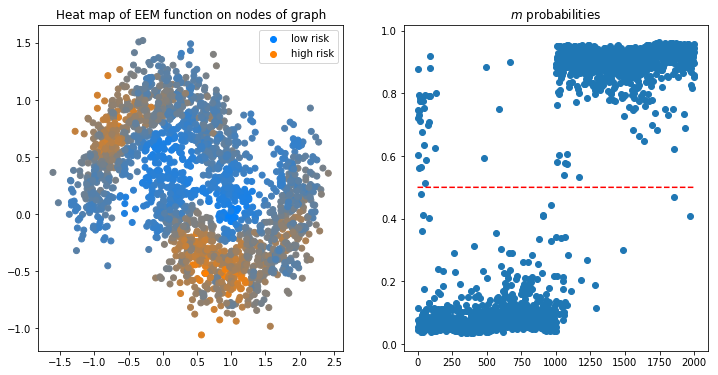

True
Iter = 40


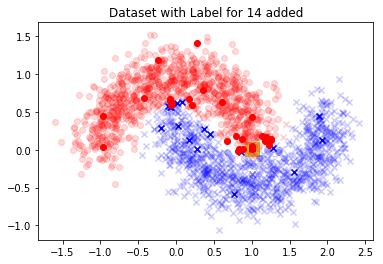

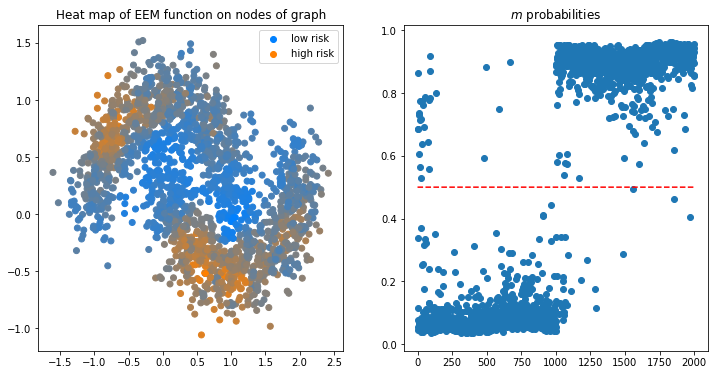

[(-1, 0.12237762237762238), (190, 0.07942057942057942), (1079, 0.06493506493506493), (109, 0.054945054945054944), (1090, 0.03296703296703297), (1016, 0.040459540459540456), (718, 0.03696303696303696), (1033, 0.03996003996003996), (110, 0.040459540459540456), (1702, 0.038461538461538464), (393, 0.03796203796203796), (434, 0.029470529470529472), (1650, 0.030469530469530468), (1390, 0.036463536463536464), (89, 0.035464535464535464), (942, 0.036463536463536464), (463, 0.03696303696303696), (1026, 0.035464535464535464), (575, 0.033466533466533464), (1276, 0.033466533466533464), (69, 0.03396603396603397), (48, 0.03396603396603397), (86, 0.033466533466533464), (1013, 0.034465534465534464), (567, 0.033466533466533464), (1092, 0.03296703296703297), (1017, 0.03296703296703297), (108, 0.033466533466533464), (82, 0.03296703296703297), (1442, 0.033466533466533464), (37, 0.033466533466533464), (515, 0.03296703296703297), (1007, 0.03296703296703297), (683, 0.032467532467532464), (75, 0.03196803196803

In [21]:
# Active Learning Choices  -- EEM
fid = copy.deepcopy(moon_data.fid)
ERRS, M = run_test_AL(moon_data.X, moon_data.evecs, moon_data.evals, fid, moon_data.ground_truth, 
                               tag2=tag2, test_opts=(num_iters, verbose))

if verbose:
    print(ERRS)

calc_orig_multi took 0.528649 seconds
Iter = 0


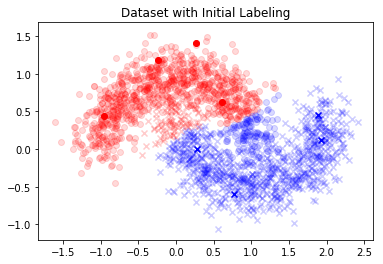

Time for S_opt = 0.039460
Time for S_opt = 0.043226
Time for S_opt = 0.047728
Time for S_opt = 0.044116
Time for S_opt = 0.046888
Iter = 1


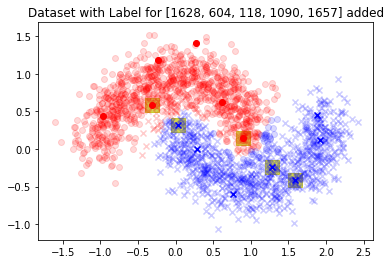

Time for S_opt = 0.036171
Time for S_opt = 0.033713
Time for S_opt = 0.033778
Time for S_opt = 0.032662
Time for S_opt = 0.033100
Iter = 2


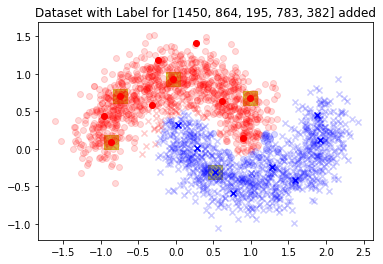

Time for S_opt = 0.036172
Time for S_opt = 0.037560
Time for S_opt = 0.034804
Time for S_opt = 0.030318
Time for S_opt = 0.034135
Iter = 3


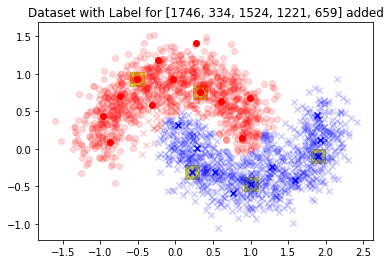

Time for S_opt = 0.037894
Time for S_opt = 0.032590
Time for S_opt = 0.032990
Time for S_opt = 0.032288
Time for S_opt = 0.032714
Iter = 4


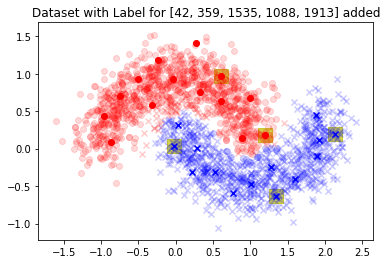

Time for S_opt = 0.036496
Time for S_opt = 0.033232
Time for S_opt = 0.032392
Time for S_opt = 0.032811
Time for S_opt = 0.032293
Iter = 5


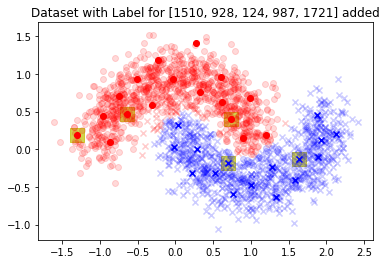

Time for S_opt = 0.035336
Time for S_opt = 0.032497
Time for S_opt = 0.032093
Time for S_opt = 0.031998
Time for S_opt = 0.032737
Iter = 6


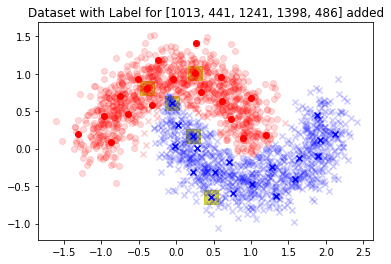

Time for S_opt = 0.034603
Time for S_opt = 0.033232
Time for S_opt = 0.031899
Time for S_opt = 0.032557
Time for S_opt = 0.031750
Iter = 7


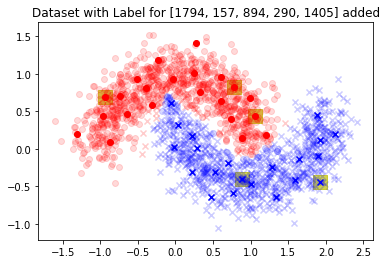

Time for S_opt = 0.036596
Time for S_opt = 0.032262
Time for S_opt = 0.032280
Time for S_opt = 0.031876
Time for S_opt = 0.032113
Iter = 8


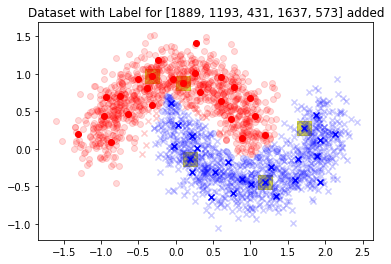

[(-1, 0.12237762237762238), ([1628, 604, 118, 1090, 1657], 0.05194805194805195), ([1450, 864, 195, 783, 382], 0.04945054945054945), ([1746, 334, 1524, 1221, 659], 0.04945054945054945), ([42, 359, 1535, 1088, 1913], 0.041458541458541456), ([1510, 928, 124, 987, 1721], 0.041458541458541456), ([1013, 441, 1241, 1398, 486], 0.03396603396603397), ([1794, 157, 894, 290, 1405], 0.03396603396603397), ([1889, 1193, 431, 1637, 573], 0.033466533466533464)]


In [22]:
# Active Learning Choices  -- Sigma_Opt
fid = copy.deepcopy(moon_data.fid)
method = 'S'
ERRS_S, M_S = run_test_AL_VS_multi(moon_data.X, moon_data.evecs, moon_data.evals, fid, moon_data.ground_truth, 
                                   method='S', tag2=tag2, test_opts=test_opts)

if verbose:
    print(ERRS_S)

In [23]:
# Random choices
fid = copy.deepcopy(moon_data.fid)
show_all_iters = True
ERRS_rand, M_rand = run_test_rand_multi(moon_data.X, moon_data.evecs, moon_data.evals, fid, moon_data.ground_truth, 
                                        tag2=tag2, test_opts=(num_iters, False), show_all_iters=show_all_iters)
if verbose:
    print(ERRS_rand)

[(-1, 0.12237762237762238), (148, 0.07992007992007992), (1666, 0.08141858141858142), (917, 0.08491508491508491), (1465, 0.08441558441558442), (662, 0.08491508491508491), (1204, 0.08291708291708291), (1014, 0.053946053946053944), (1092, 0.05844155844155844), (818, 0.058941058941058944), (924, 0.05944055944055944), (163, 0.05844155844155844), (57, 0.03596403596403597), (928, 0.03896103896103896), (1229, 0.037462537462537464), (382, 0.036463536463536464), (1369, 0.036463536463536464), (1337, 0.036463536463536464), (387, 0.036463536463536464), (1286, 0.037462537462537464), (24, 0.035464535464535464), (156, 0.03496503496503497), (1060, 0.040459540459540456), (318, 0.04095904095904096), (525, 0.03996003996003996), (1892, 0.039460539460539464), (464, 0.039460539460539464), (1114, 0.036463536463536464), (1405, 0.036463536463536464), (1051, 0.05344655344655345), (75, 0.055944055944055944), (1345, 0.055944055944055944), (420, 0.055944055944055944), (1622, 0.05544455544455545), (175, 0.0559440559

## Error Plotting - 2 Moons 

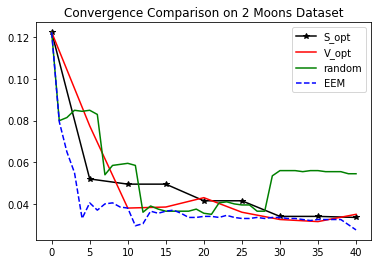

In [32]:
colors = ['y', 'r', 'k', 'g']
ids, errs =zip(*ERRS)
ids_s, errs_s = zip(*ERRS_S)
ids_v, errs_v = zip(*ERRS_V)
ids_rand, errs_rand = zip(*ERRS_rand)
num_batches = int(num_iters / batch_size)
plt.figure()
plt.plot([i*batch_size for i in range(num_batches+1)], errs_s, 'k*-', label='S_opt')
plt.plot([i*batch_size for i in range(num_batches+1)], errs_v, 'r', label='V_opt')
if show_all_iters:
    plt.plot([i for i in range(num_iters+1)], errs_rand, 'g', label='random')
else:
    plt.plot([0,num_iters], errs_rand, 'g', label='random')
plt.plot([i for i in range(num_iters+1)], errs, 'b--', label='EEM')
plt.legend()
plt.title('Convergence Comparison on 2 Moons Dataset')
plt.show()

# 2 Gaussian Clusters

In [ ]:
# Problem Setup --- Need to rework this example to be more general. I've made it so that the clusters are 
# in consecutive order for plotting m (0-99, 100-199). For this I had to re write the helper functions when 
# doing the Two moons dataset.

Ns = [200,200]
N = sum(Ns)
means = [np.array([1.0,0.]), np.array([-1.0,0.])]
Covs = [0.3*np.eye(2), 0.3*np.eye(2)]

g2_data = load_gaussian_cluster(Ns, means, Covs, normed_lap=True)

# Model Setup
tau, alpha, gamma = 0.1, 1.0, 0.01
gamma2 = gamma**2.
verbose = True     # set to True if want to see visual of which points chosen
num_iters = 10
batch_size = 5
tag2 = (tau, alpha, gamma2)

In [ ]:
# Active Learning - Sigma optimal multiclass
fid = copy.deepcopy(g2_data.fid)
method = 'S'
test_opts = (batch_size, num_iters, verbose)
ERRS_S, M_S = run_test_AL_VS_multi(g2_data.X, g2_data.evecs, g2_data.evals, fid, g2_data.ground_truth, 
                                   method, tag2, test_opts)

if verbose:
    print(ERRS_S)

In [ ]:
g2_data.fid[-1] = g2_data.fid[0]
del g2_data.fid[0]
g2_data.ground_truth[g2_data.ground_truth == 0] = -1

In [ ]:
# Active Learning - EEM binary class
fid = copy.deepcopy(g2_data.fid)
test_opts = (num_iters, verbose)
ERRS, M = run_test_AL(g2_data.X, g2_data.evecs, g2_data.evals, fid, g2_data.ground_truth, 
                        tag2, test_opts)

if verbose:
    print(ERRS)

# Gaussian Clusters Example - 3 clusters

Note now we don't calculate the EEM method for choosing queries because we haven't generalized the 0-1 risk calculation of Zhu et al for the multiclass case. So in the multiclass case we are just showing V and $\Sigma$ optimality choices.

In [ ]:
# Problem Setup --- Need to rework this example to be more general. I've made it so that the clusters are 
# in consecutive order for plotting m (0-99, 100-199). For this I had to re write the helper functions when 
# doing the Two moons dataset.

Ns = [50,50,50]
N = sum(Ns)
fs = 5
means = [np.array([1.0,0.]), np.array([-1.0,0.]), np.array([0.,1.0])]
Covs = [0.15*np.eye(2), 0.15*np.eye(2), 0.15*np.eye(2)]
data = load_gaussian_cluster(Ns, means, Covs)
data.plot_initial()

In [ ]:
# Model Setup
tau, alpha, gamma = 0.1, 1.0, 0.001
gamma2 = gamma**2.
tag2 = (tau, alpha, gamma2)
verbose = False     # set to True if want to see visual of which points chosen
num_iters = 20
batch_size = 5



In [ ]:
# Active Learning - Sigma optimal multiclass
fid = copy.deepcopy(data.fid)
method = 'S'
test_opts = (batch_size, num_iters, verbose)
ERRS_S, M_S = run_test_AL_VS_multi(data.X, data.evecs, data.evals, fid, data.ground_truth, method, tag2, test_opts)

if verbose:
    print(ERRS_S)

# Active Learning - V optimal multiclass
fid = copy.deepcopy(data.fid)
method = 'V'
test_opts = (batch_size, num_iters, verbose)
ERRS_V, M_V = run_test_AL_VS_multi(data.X, data.evecs, data.evals, fid, data.ground_truth, method, tag2, test_opts)

if verbose:
    print(ERRS_V)

fid = copy.deepcopy(data.fid)
tag2 = (tau, alpha, gamma2)
test_opts = (num_iters, False)
show_all_iters = True
ERRS_rand, M_rand = run_test_rand_multi(data.X, data.evecs, data.evals, fid, data.ground_truth, tag2, 
                                        test_opts, show_all_iters=show_all_iters)

if verbose:
    print(ERRS_rand)

## Convergence Comparison

In [ ]:
num_batches = int(num_iters/batch_size)
ids_s, errs_s = zip(*ERRS_S)
ids_v, errs_v = zip(*ERRS_V)
ids_rand, errs_rand = zip(*ERRS_rand)
plt.figure()
plt.plot([i*batch_size for i in range(num_batches+1)], errs_s, 'b--', label='S_opt')
plt.plot([i*batch_size for i in range(num_batches+1)], errs_v, 'r--', label='V_opt')
if show_all_iters:
    plt.plot([i for i in range(num_iters+1)], errs_rand, 'g', label='random')
else:
    plt.plot([0,num_iters], errs_rand, 'g', label='random')
plt.title('Convergence Comparison on 3 Gaussian Cluster')
plt.legend()